In [1]:
import os.path as osp
import numpy as np
import torch
import math
from icecream import ic
from matplotlib import pyplot as plt
from PIL import Image, ImageDraw, ImageFont, ImageColor

from transformers import Qwen2_5_VLForConditionalGeneration, AutoProcessor

# model_path3 = "Qwen/Qwen2.5-VL-3B-Instruct"
model_path7 = "Qwen/Qwen2.5-VL-7B-Instruct"
# model3 = Qwen2_5_VLForConditionalGeneration.from_pretrained(model_path3, torch_dtype=torch.bfloat16, attn_implementation="flash_attention_2",device_map="auto")
model7 = Qwen2_5_VLForConditionalGeneration.from_pretrained(model_path7, torch_dtype=torch.bfloat16, attn_implementation="flash_attention_2",device_map="auto")
processor = AutoProcessor.from_pretrained(model_path7)

/home/cyoh/anaconda3/envs/pav/lib/python3.10/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm
Loading checkpoint shards: 100%|██████████| 5/5 [00:02<00:00,  1.83it/s]
Using a slow image processor as `use_fast` is unset and a slow processor was saved with this model. `use_fast=True` will be the default behavior in v4.52, even if the model was saved with a slow processor. This will result in minor differences in outputs. You'll still be able to use a slow processor with `use_fast=False`.


In [2]:
from pav_agent.pav_agents import Planner, Actor, Verifier, agent_preprocess
plan = Planner()
act = Actor()
verify = Verifier()

In [3]:
# Planner Inference

# screenshot = '/home/cyoh/PAV/general/GENERAL-6669219026335480270/GENERAL-6669219026335480270_3.png'  # AITZ
# screenshot = '/home/cyoh/PAV/mcdonalds_images_65_episodes/72/72_3.png'  # McDonalds
screenshot = '/home/cyoh/PAV/google/google_25_0.png'  # GoogleMap

user_query = 'instruction = "Please add Restaurant Yori to Want to go list."'
previous_macro_action_plan = []
# previous_macro_action_plan = [
#                     "Search 'Namsan Tower'",
#                     "Select direction",
#                 ]

macro_action_plan = plan.planner(model7, processor, screenshot, user_query, previous_macro_action_plan)
print(macro_action_plan)

['{"macro-actions": "search", "arguments": {"target": "Restaurant Yori"}}', '{"macro-actions": "select", "arguments": {"button": "Save"}}', '{"macro-actions": "select", "arguments": {"list": "Want to go list"}}', '{"macro-actions": "terminate", "arguments": {"status": "Done_Actions"}}']
{"macro-actions": "search", "arguments": {"target": "Restaurant Yori"}}
{"macro-actions": "select", "arguments": {"button": "Save"}}
{"macro-actions": "select", "arguments": {"list": "Want to go list"}}
{"macro-actions": "terminate", "arguments": {"status": "Done_Actions"}}
action :  {'macro-actions': 'search', 'arguments': {'target': 'Restaurant Yori'}}
action :  {'macro-actions': 'select', 'arguments': {'button': 'Save'}}
action :  {'macro-actions': 'select', 'arguments': {'list': 'Want to go list'}}
action :  {'macro-actions': 'terminate', 'arguments': {'status': 'Done_Actions'}}
['search Restaurant Yori', 'select Save', 'Done_Actions']


output :  <tool_call>
{"name": "actor_use", "arguments": {"action": "terminate", "status": "success"}}
</tool_call>


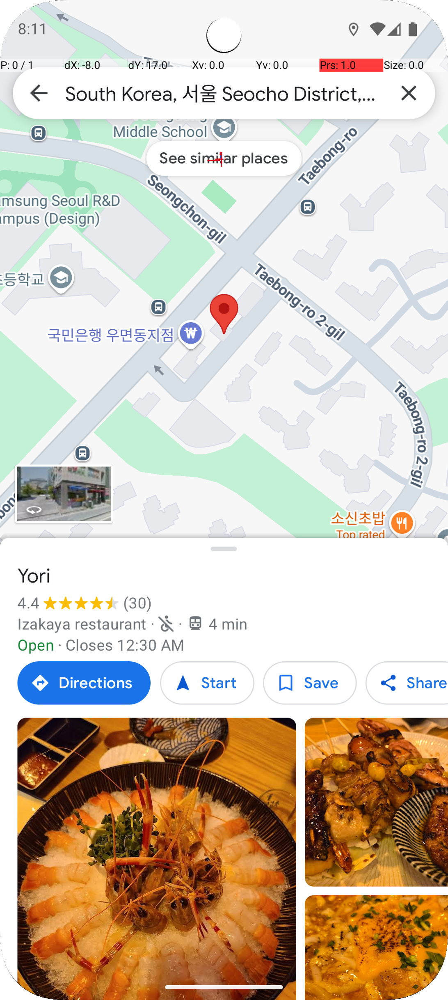

{'name': 'actor_use', 'arguments': {'action': 'terminate', 'status': 'success'}}
verifier output :  To determine if the action of searching for "Restaurant Yori" has been completed, let's analyze the information provided in the screenshots:

1. The first screenshot shows a map view with a pin indicating the location of "Yori," an Izakaya restaurant. This suggests that the search for "Restaurant Yori" has led to the display of its location on the map.

2. The second screenshot shows a "Save to list" screen where the user can save the location to different lists. This indicates that the user is in the process of saving the location, which is a step after finding it.

Given these observations, the action of searching for "Restaurant Yori" appears to have been completed as the location has been found and displayed on the map. However, the user is still in the process of saving this location to a list.

Therefore, the action has been completed, but the user is still interacting with the app

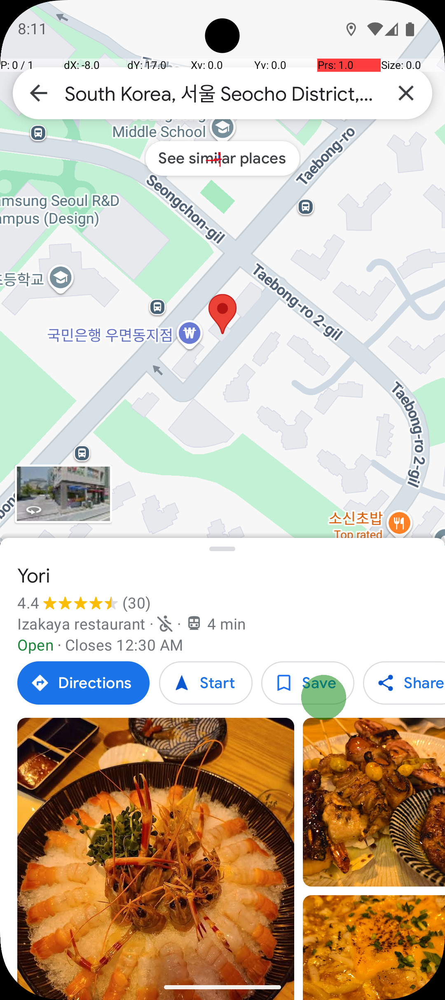

{'name': 'actor_use', 'arguments': {'action': 'click', 'coordinate': [785, 1690]}}
verifier output :  To determine if the action of selecting "Save" has been completed, I need to check if there is any indication that the save operation has been finalized or if the screen is still in the process of saving.

1. In the first screenshot, the "Save to list" option is visible, indicating that the save operation is in progress.
2. In the second screenshot, the "Save to list" option is no longer visible, suggesting that the save operation may have been completed.
3. The presence of the "Done" button at the top right corner of both screenshots implies that the user can finalize the save operation by tapping this button.

Given these observations, it appears that the save operation might have been completed between the two screenshots. However, since the "Save to list" option is no longer visible in the second screenshot, we can infer that the save operation was likely completed before the secon

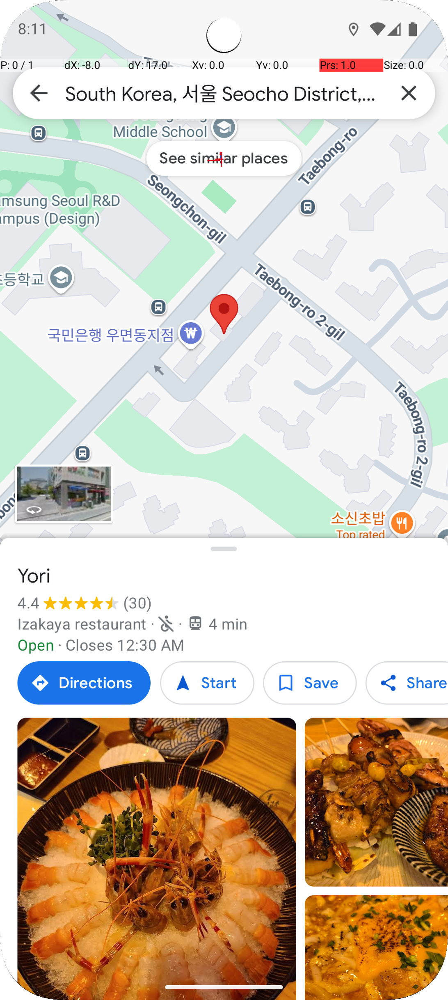

{'name': 'actor_use', 'arguments': {'action': 'terminate', 'status': 'success'}}
verifier output :  To determine if the action "Done_Actions" has been completed, I need to check if any of the checkboxes next to the list items have been selected.

In the first screenshot, none of the checkboxes are checked (indicated by the empty squares).

In the second screenshot, there is no change from the first screenshot; all checkboxes remain unchecked.

Since the action "Done_Actions" involves selecting a checkbox, and neither screenshot shows any checkbox being selected, it indicates that the action has not been completed.

<verify>
{
    "action_completed": 0,
    "reason": "No checkbox has been selected in either screenshot."
}
</verify>
['{\n    "action_completed": 0,\n    "reason": "No checkbox has been selected in either screenshot."\n}']
verify :  0
reason :  No checkbox has been selected in either screenshot.
0
3
output :  <tool_call>
{"name": "actor_use", "arguments": {"action": "termin

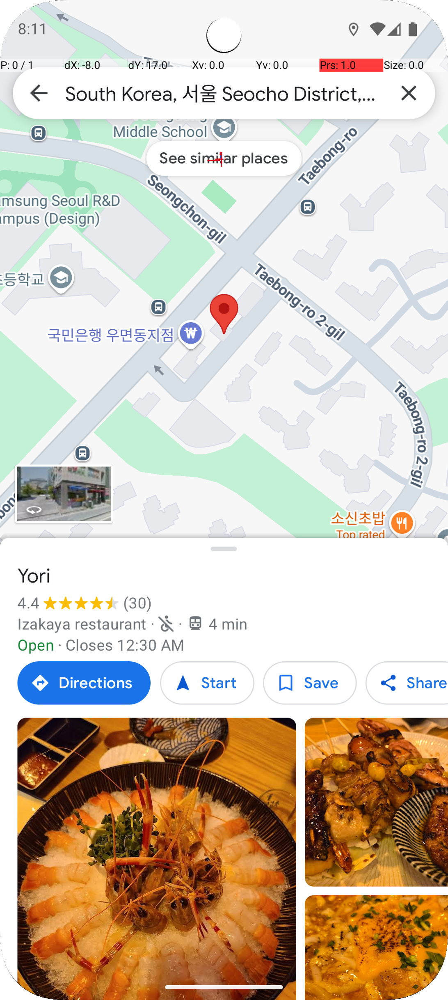

{'name': 'actor_use', 'arguments': {'action': 'terminate', 'status': 'success'}}
verifier output :  To determine if the action "Done_Actions" has been completed, I need to check if any of the checkboxes next to the list items have been selected.

In the first screenshot, none of the checkboxes are checked (indicated by the empty square).

In the second screenshot, the checkbox next to "Favorites" is now checked (indicated by the filled square).

Since the action "Done_Actions" involves selecting a list item, and we see that the "Favorites" list item has been selected in the second screenshot, it indicates that the action has been completed.

Therefore, the action has been completed.

<verify>
{
    "action_completed": 1,
    "reason": "The 'Favorites' checkbox is checked, indicating the action has been completed."
}
</verify>
['{\n    "action_completed": 1,\n    "reason": "The \'Favorites\' checkbox is checked, indicating the action has been completed."\n}']
verify :  1
reason :  The '

In [ ]:
# Actor Inference

# screenshot = '/home/cyoh/PAV/general/GENERAL-6669219026335480270/GENERAL-6669219026335480270_3.png'  # AITZ
# screenshot = '/home/cyoh/PAV/mcdonalds_images_65_episodes/72/72_3.png'  # McDonalds
screenshot = '/home/cyoh/PAV/google/google_25_3.png'  # GoogleMap

user_query = 'instruction = "Please add Restaurant Yori to Want to go list."'

macro_mask = [False] * len(macro_action_plan)
step = 0    # macro action step
trial = 0   # micro action trial
curr_screenshot = screenshot
while not all(macro_mask):
    curr_macro_action = macro_action_plan[step]
    micro_action_plan = act.actor(model7, processor, screenshot, curr_macro_action)
    print(micro_action_plan)

    # Interact with Emulator
    # next_screenshot = emulator(micro_action_plan)
    trial += 1

    # Verifier
    next_screenshot = '/home/cyoh/PAV/google/google_25_4.png'

    macro_mask[step] = verify.verifier(model7, processor, curr_screenshot, next_screenshot, curr_macro_action)
    print(macro_mask[step])
    
    if macro_mask[step] == True:
        step += 1
        curr_screenshot = next_screenshot
        previous_macro_action_plan.append(curr_macro_action)
        trial = 0

    next_screenshot = '/home/cyoh/PAV/google/google_25_5.png'

    if trial > 5:
        print("Macro action replan needed!")
        break

print("End of PAV")